# Unsupervised Learning Notebook
SIADS 696 Milestone 2 - Team 24

Notebook author: Auston Balwinski

## Library Imports

In [ ]:
# Import necessary libraries
# Standard libraries
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
import plotly.express as px

# Machine learning libraries
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import (
    DBSCAN,
    KMeans,
    HDBSCAN,
    AgglomerativeClustering,
    MiniBatchKMeans,
)
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.stats import zscore

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

# Set random state for reproducibility
random_state = 42

# Set default renderer for Plotly for compatibility
pio.renderers.default = "notebook" # Standard setting

## Data Ingestion and Preprocessing


In [2]:
# Load the data

# If using Google Colab, uncomment the following lines to mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')
# file_path = '/content/drive/MyDrive/Colab Notebooks/MADS/SIADS 696/Data/ocean_processed.csv'

file_path = "data/ocean_processed.csv"

df_test = pd.read_csv(file_path)
df_test.drop(["CAST", "Country"], axis=1, inplace=True)

In [3]:
# Removing extreme outliers
zscores = zscore(df_test)
threshold = 5
outliers = df_test[np.abs(zscores) > threshold]
print(f"Number of outliers: {outliers.shape[0]}")
df_test = df_test[(np.abs(zscores) <= threshold).all(axis=1)]
print(f"Data shape after removing outliers: {df_test.shape}")

Number of outliers: 875
Data shape after removing outliers: (602036, 15)


array([[<Axes: title={'center': 'Latitude'}>,
        <Axes: title={'center': 'Longitude'}>,
        <Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Month'}>],
       [<Axes: title={'center': 'Day'}>,
        <Axes: title={'center': 'Time'}>,
        <Axes: title={'center': 'Bottom depth'}>,
        <Axes: title={'center': 'Depth'}>],
       [<Axes: title={'center': 'Temperature'}>,
        <Axes: title={'center': 'Salinity'}>,
        <Axes: title={'center': 'Oxygen'}>,
        <Axes: title={'center': 'Phosphate'}>],
       [<Axes: title={'center': 'Silicate'}>,
        <Axes: title={'center': 'Nitrate'}>,
        <Axes: title={'center': 'Pressure'}>, <Axes: >]], dtype=object)

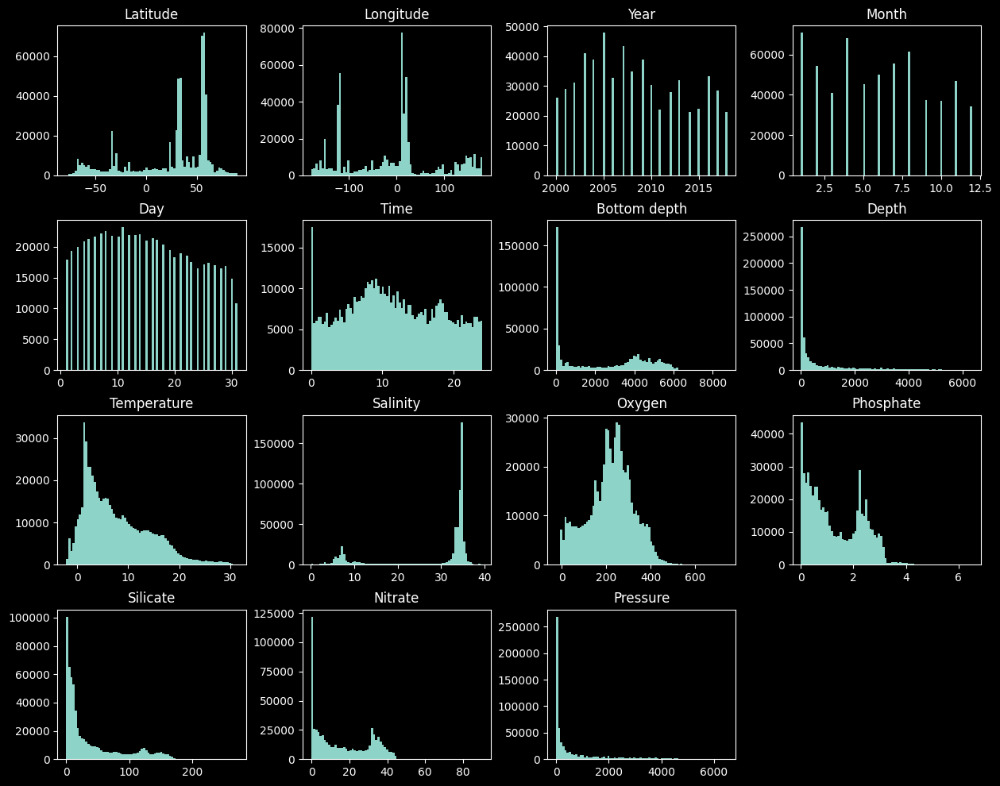

In [4]:
# Check distributions
df_test.hist(bins=80, grid=False, figsize=(15, 12))

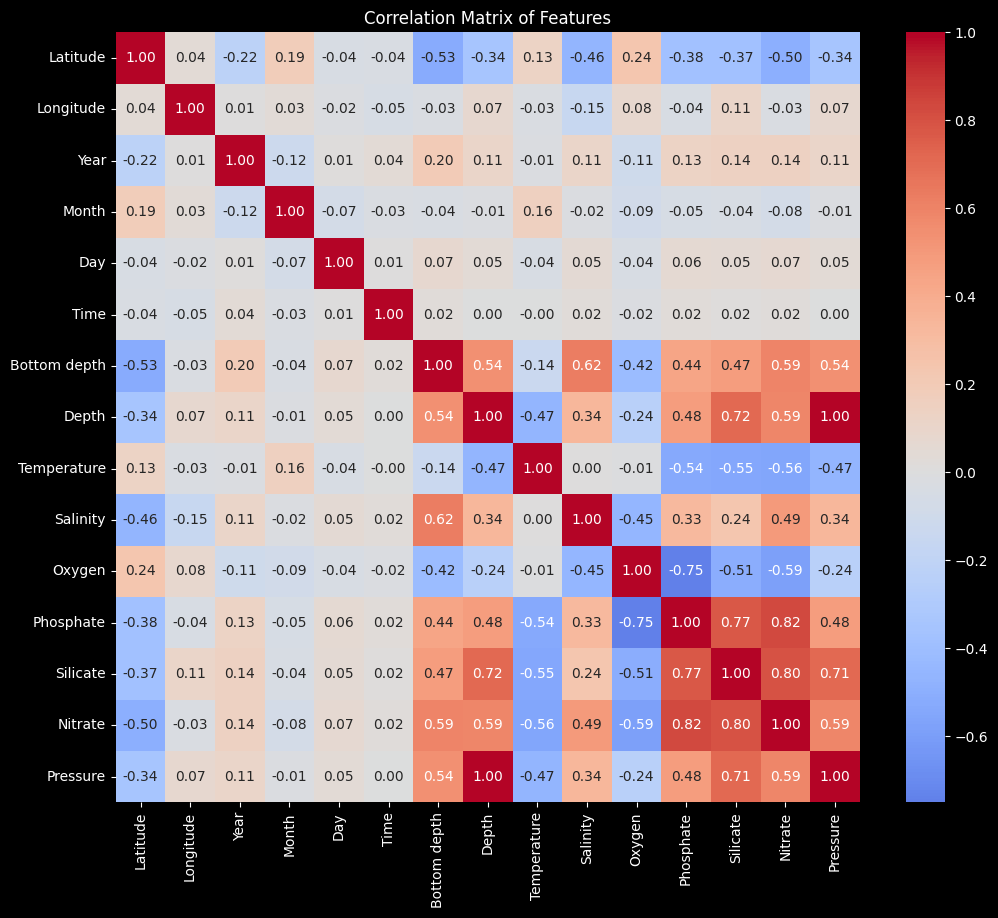

In [5]:
# Check correlations to decide on features
correlation_matrix = df_test.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Features")
plt.show()

In [6]:
# Feature selection
feature_drop = ["Depth", "Time", "Day", "Month", "Year"]
df_features = df_test.drop(columns=feature_drop)

In [7]:
# Scale the data
scaled = MinMaxScaler().fit_transform(df_features)
df_scaled = pd.DataFrame(scaled, columns=df_features.columns)

# Clustering Analysis and Comparison

## MiniBatch K-Means Clustering

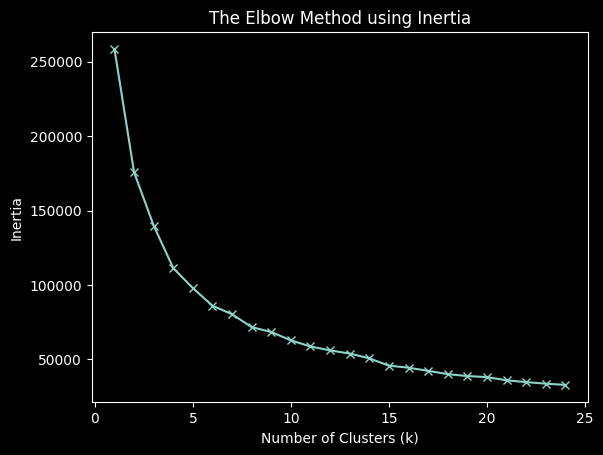

In [ ]:
# Identify optimal clusters using the inertia elbow method
inertias = []
K = range(1, 25, 1)

for k in K:
    kmean = KMeans(n_clusters=k, random_state=random_state).fit(scaled)
    inertias.append(kmean.inertia_)

plt.plot(K, inertias, "x-")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("The Elbow Method using Inertia")
plt.show()

In [9]:
# Range of clusters to try, near elbow point
n_clusters = np.arange(8, 17, 1)  # Use less to speed up MiniBatchKMeans and Agglomerative

In [10]:
# MiniBatchKMeans clustering

# Set batch size
n = len(scaled)
batch_size = max(256, int(0.10 * n))

# Iterate through cluster numbers
# Sample 10% of data for silhouette calculation due to resource constraints
silhouettes_mbkmeans = []
for num_clus in n_clusters:
    mbkmeans = MiniBatchKMeans(
        n_clusters=num_clus, random_state=random_state, batch_size=batch_size
    ).fit(scaled)
    df_scaled["Cluster_MBKMeans"] = mbkmeans.labels_
    df_samp = df_scaled.loc[
        np.random.choice(df_scaled.index, size=int(n * 0.1), replace=False)
    ]
    silhouette_score = metrics.silhouette_score(
        df_samp.drop(columns=["Cluster_MBKMeans"]), df_samp["Cluster_MBKMeans"]
    )
    silhouettes_mbkmeans.append((num_clus, silhouette_score))
    print(f"clusters: {num_clus}, silhouette: {silhouette_score:.3f}")

# Find best number of clusters
top_three = sorted(silhouettes_mbkmeans, key=lambda x: x[1], reverse=True)[:3]
best = top_three[0]
print(
    f"Best number of clusters for MiniBatchKMeans: {best[0]} with silhouette score {best[1]:.3f}"
)
mbkmeans = MiniBatchKMeans(
    n_clusters=best[0], random_state=random_state, batch_size=batch_size
).fit(scaled)
df_scaled["Cluster_MBKMeans"] = mbkmeans.labels_
df_test["Cluster_MBKMeans"] = mbkmeans.labels_
print("\nCluster distribution:")
print(df_scaled.value_counts("Cluster_MBKMeans").sort_index())

clusters: 8, silhouette: 0.317
clusters: 9, silhouette: 0.305
clusters: 10, silhouette: 0.326
clusters: 11, silhouette: 0.317
clusters: 12, silhouette: 0.326
clusters: 13, silhouette: 0.325
clusters: 14, silhouette: 0.322
clusters: 15, silhouette: 0.322
clusters: 16, silhouette: 0.324
Best number of clusters for MiniBatchKMeans: 10 with silhouette score 0.326

Cluster distribution:
Cluster_MBKMeans
0    63913
1    40972
2    83627
3    77948
4    67982
5    75256
6    42055
7    18382
8    92552
9    39349
Name: count, dtype: int64


### Sample the dataset for further cluster anaysis due to resource constraints

In [11]:
# Choose sample fraction for clustering
# frac = 0.05  # Sample 5% of the data
frac = 0.1  # Sample 10% of the data

df_sampled = df_scaled.sample(frac=frac, random_state=random_state).copy()
scaled = np.array(df_sampled.drop(columns=["Cluster_MBKMeans"]))
print("Length of sampled dataset:", len(scaled))

Length of sampled dataset: 60204


## Agglomerative Clustering

In [12]:
# Agglomerative clustering and silhouette scores
# Tests top three MBKMeans cluster numbers
silhouettes_agglo = []
for num_clus, _ in top_three:
    agglo = AgglomerativeClustering(
        n_clusters=num_clus, linkage="ward", metric="euclidean"
    ).fit(scaled)

    silhouette_score = metrics.silhouette_score(scaled, agglo.labels_)
    silhouettes_agglo.append((num_clus, silhouette_score))
    print(f"clusters: {num_clus}, silhouette: {silhouette_score:.3f}")

# Find best number of clusters
best = max(silhouettes_agglo, key=lambda x: x[1])
print(
    f"\nBest number of clusters for Agglomerative Clustering: {best[0]} with silhouette score {best[1]:.3f}"
)

# Fit final model with best number of clusters
agglo = AgglomerativeClustering(
    n_clusters=best[0], linkage="ward", metric="euclidean"
).fit(scaled)
df_sampled["Agglo_Labels"] = agglo.labels_
print("\nCluster Counts:")
print(df_sampled.value_counts("Agglo_Labels").sort_index())

clusters: 10, silhouette: 0.300
clusters: 12, silhouette: 0.285
clusters: 13, silhouette: 0.287

Best number of clusters for Agglomerative Clustering: 10 with silhouette score 0.300

Cluster Counts:
Agglo_Labels
0     6803
1    12434
2     5579
3     6693
4     5721
5     4317
6     6152
7     6886
8     3872
9     1747
Name: count, dtype: int64


## HDBSCAN Clustering

In [13]:
# Set HDBSCAN parameter ranges based on dataset sample fraction variable
if frac == 0.05:
    min_cluster_size = [2000, 2250, 2500, 2750]
    min_samples = [80, 85, 90]
elif frac == 0.10:
    min_cluster_size = [4250, 4500, 4750]
    min_samples = [2, 5, 10, 12]

print(
    f"Testing HDBSCAN parameter combinations... (Total: {len(min_cluster_size) * len(min_samples)} combinations)"
)

# Iterate through HDBSCAN parameter combinations and calculate silhouette scores
silhouette_hdbscan = []
for i in min_cluster_size:
    for j in min_samples:
        try:
            HDB = HDBSCAN(
                min_cluster_size=i, min_samples=j, allow_single_cluster=False, n_jobs=-1
            ).fit(scaled)
            labels = HDB.labels_
            n_clusters = len(set(labels) - {-1})
            n_noise = list(labels).count(-1)

            # Only calculate silhouette score if we have at least 2 clusters
            if n_clusters >= 2:
                silhouette_score = metrics.silhouette_score(scaled, labels)
                noise_pct = (n_noise / len(labels)) * 100
                silhouette_hdbscan.append(
                    (i, j, silhouette_score, n_clusters, n_noise, noise_pct)
                )
                print(
                    f"min_cluster_size: {i:3d}, min_samples: {j:3d}, silhouette: {silhouette_score:6.5f}, clusters: {n_clusters:2d}, noise: {n_noise:6d} ({noise_pct:5.1f}%)"
                )
            else:
                print(
                    f"min_cluster_size: {i:3d}, min_samples: {j:3d}, skipped (only {n_clusters} cluster(s))"
                )
        except Exception as e:
            print(f"min_cluster_size: {i:3d}, min_samples: {j:3d}, error: {e}")

# Find best parameters
if silhouette_hdbscan:
    # Sort by silhouette score and show top 5
    silhouette_hdbscan_sorted = sorted(
        silhouette_hdbscan, key=lambda x: x[2], reverse=True
    )
    print(f"\n{'=' * 80}")
    print("Top 5 HDBSCAN configurations:")
    for idx, (mcs, ms, sil, nc, nn, npct) in enumerate(
        silhouette_hdbscan_sorted[:5], 1
    ):
        print(
            f"{idx}. min_cluster_size={mcs:3d}, min_samples={ms:3d}, silhouette={sil:.5f}, clusters={nc:2d}, noise={nn:6d} ({npct:5.1f}%)"
        )

    best = silhouette_hdbscan_sorted[0]
    print(f"\nUsing best params: min_cluster_size={best[0]}, min_samples={best[1]}")
    print(
        f"Silhouette score: {best[2]:.5f}, Clusters: {best[3]}, Noise points: {best[4]} ({best[5]:.1f}%)"
    )

    # Fit final model with best parameters
    HDB = HDBSCAN(
        min_cluster_size=best[0],
        min_samples=best[1],
        allow_single_cluster=False,
        n_jobs=-1,
    ).fit(scaled)
    labels = HDB.labels_
    df_sampled["HDBSCAN_cluster"] = labels
    print("\nCluster distribution:")
    print(df_sampled.value_counts("HDBSCAN_cluster").sort_index())
else:
    print("\nNo valid HDBSCAN configurations found!")

Testing HDBSCAN parameter combinations... (Total: 12 combinations)


min_cluster_size: 4250, min_samples:   2, silhouette: 0.05699, clusters:  5, noise:  10344 ( 17.2%)
min_cluster_size: 4250, min_samples:   5, silhouette: 0.04940, clusters:  4, noise:  16932 ( 28.1%)
min_cluster_size: 4250, min_samples:  10, silhouette: 0.04555, clusters:  4, noise:  19760 ( 32.8%)
min_cluster_size: 4250, min_samples:  12, silhouette: 0.04503, clusters:  4, noise:  21402 ( 35.5%)
min_cluster_size: 4500, min_samples:   2, silhouette: 0.12990, clusters:  3, noise:   8516 ( 14.1%)
min_cluster_size: 4500, min_samples:   5, silhouette: 0.12598, clusters:  3, noise:  10840 ( 18.0%)
min_cluster_size: 4500, min_samples:  10, silhouette: 0.12846, clusters:  3, noise:  14051 ( 23.3%)
min_cluster_size: 4500, min_samples:  12, silhouette: 0.12977, clusters:  3, noise:  16336 ( 27.1%)
min_cluster_size: 4750, min_samples:   2, silhouette: 0.12990, clusters:  3, noise:   8516 ( 14.1%)
min_cluster_size: 4750, min_samples:   5, silhouette: 0.12598, clusters:  3, noise:  10840 ( 18.0%)


## DBSCAN Clustering

Median distance: 0.059432589444391976
Mean distance: 0.06712224365335039


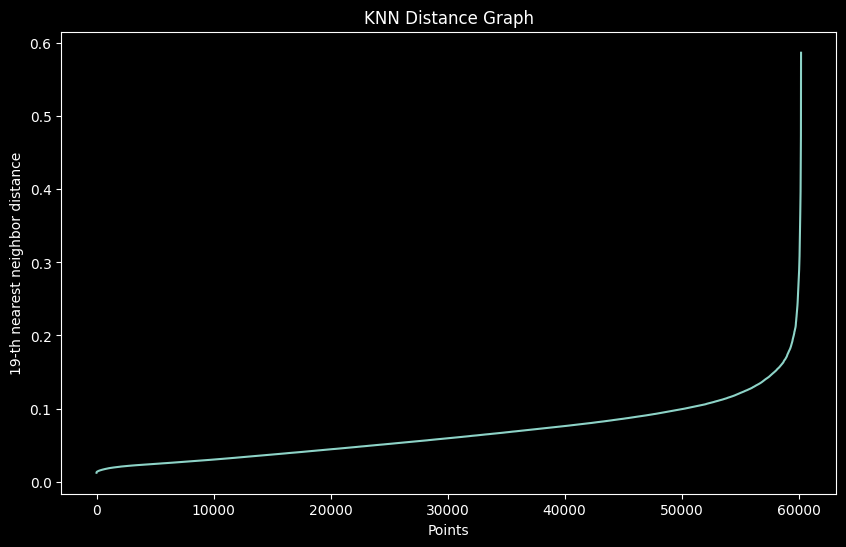

In [14]:
# Function to calculate Nearest Neighbors distances for k-distance graph
def calculate_k_distance(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k - 1])

    return distances


k = (scaled.shape[1] * 2) - 1  # Number of features

# Plot k-distance graph
distances = calculate_k_distance(scaled, k=k)
med_dist = np.median(distances)
mean_dist = np.mean(distances)
print("Median distance:", med_dist)
print("Mean distance:", mean_dist)

plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel(f"{k}-th nearest neighbor distance")
plt.title("KNN Distance Graph")
plt.show()

In [15]:
# Set DBSCAN parameter ranges based on dataset sample fraction variable
# eps range based on KNN distance analysis
if frac == 0.05:
    eps_values = [0.25, 0.26, 0.27]
    min_samples_values = [625, 675, 725]
elif frac == 0.10:
    eps_values = [0.20, 0.21, 0.22]
    min_samples_values = [900, 1000, 1100]

silhouette_dbscan = []

print(
    f"Testing DBSCAN parameter combinations... (Total: {len(eps_values) * len(min_samples_values)} combinations)"
)

# Iterate through DBSCAN parameter combinations and calculate silhouette scores
for e in eps_values:
    for m in min_samples_values:
        try:
            db = DBSCAN(eps=e, min_samples=m, n_jobs=-1).fit(scaled)
            labels = db.labels_
            n_clusters = len(set(labels) - {-1})
            n_noise = list(labels).count(-1)

            # Only calculate silhouette score if we have at least 2 clusters
            if n_clusters >= 2:
                silhouette_score = metrics.silhouette_score(scaled, labels)
                noise_pct = (n_noise / len(labels)) * 100
                silhouette_dbscan.append(
                    (e, m, silhouette_score, n_clusters, n_noise, noise_pct)
                )
                print(
                    f"eps: {e:.2f}, min_samples: {m:3d}, silhouette: {silhouette_score:6.3f}, clusters: {n_clusters:2d}, noise: {n_noise:6d} ({noise_pct:5.1f}%)"
                )
            else:
                print(
                    f"eps: {e:.2f}, min_samples: {m:3d}, skipped (only {n_clusters} cluster(s))"
                )
        except Exception as e_obj:
            print(f"eps: {e:.2f}, min_samples: {m:3d}, error: {e_obj}")

# Find best parameters
if silhouette_dbscan:
    # Sort by silhouette score and show top 5
    silhouette_dbscan_sorted = sorted(
        silhouette_dbscan, key=lambda x: x[2], reverse=True
    )
    print(f"\n{'=' * 80}")
    print("Top 5 DBSCAN configurations:")
    for idx, (eps, ms, sil, nc, nn, npct) in enumerate(silhouette_dbscan_sorted[:5], 1):
        print(
            f"{idx}. eps={eps:.2f}, min_samples={ms:3d}, silhouette={sil:.3f}, clusters={nc:2d}, noise={nn:6d} ({npct:5.1f}%)"
        )

    best = silhouette_dbscan_sorted[0]
    print(f"\nUsing best params: eps={best[0]:.2f}, min_samples={best[1]}")
    print(
        f"Silhouette score: {best[2]:.3f}, Clusters: {best[3]}, Noise points: {best[4]} ({best[5]:.1f}%)"
    )

    # Fit final model with best parameters
    db = DBSCAN(eps=best[0], min_samples=best[1], n_jobs=-1).fit(scaled)
    labels = db.labels_
    df_sampled["DBSCAN_cluster"] = labels
    print("\nCluster distribution:")
    print(df_sampled.value_counts("DBSCAN_cluster").sort_index())
else:
    print("\nNo valid DBSCAN configurations found!")

Testing DBSCAN parameter combinations... (Total: 9 combinations)
eps: 0.20, min_samples: 900, silhouette:  0.183, clusters:  2, noise:  25406 ( 42.2%)
eps: 0.20, min_samples: 1000, silhouette:  0.086, clusters:  3, noise:  26576 ( 44.1%)
eps: 0.20, min_samples: 1100, silhouette:  0.068, clusters:  3, noise:  28158 ( 46.8%)
eps: 0.21, min_samples: 900, silhouette:  0.193, clusters:  2, noise:  23621 ( 39.2%)
eps: 0.21, min_samples: 1000, silhouette:  0.182, clusters:  2, noise:  25116 ( 41.7%)
eps: 0.21, min_samples: 1100, silhouette:  0.087, clusters:  3, noise:  26158 ( 43.4%)
eps: 0.22, min_samples: 900, silhouette:  0.195, clusters:  2, noise:  21917 ( 36.4%)
eps: 0.22, min_samples: 1000, silhouette:  0.194, clusters:  2, noise:  22933 ( 38.1%)
eps: 0.22, min_samples: 1100, silhouette:  0.186, clusters:  2, noise:  24138 ( 40.1%)

Top 5 DBSCAN configurations:
1. eps=0.22, min_samples=900, silhouette=0.195, clusters= 2, noise= 21917 ( 36.4%)
2. eps=0.22, min_samples=1000, silhouette=

## PCA Visual Comparison

In [16]:
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled)
pca_df = pd.DataFrame(data=pca_data, columns=["PCA1", "PCA2"])

# Combine PCA results with cluster labels
pca_df = pd.concat(
    [
        pca_df,
        df_sampled[
            ["Cluster_MBKMeans", "DBSCAN_cluster", "HDBSCAN_cluster", "Agglo_Labels"]
        ].reset_index(drop=True),
    ],
    axis=1,
)
print("Variance explained by each principal component:", pca.explained_variance_ratio_)
print("\nPrincipal components:")
for idx, component in enumerate(pca.components_):
    print(
        f"PC{idx + 1}: \n{list(zip(df_sampled.columns, map(lambda x: f'{x:.2f}', component)))}\n"
    )


Variance explained by each principal component: [0.43323114 0.18593487]

Principal components:
PC1: 
[('Latitude', '-0.38'), ('Longitude', '-0.05'), ('Bottom depth', '0.48'), ('Temperature', '-0.16'), ('Salinity', '0.49'), ('Oxygen', '-0.18'), ('Phosphate', '0.26'), ('Silicate', '0.28'), ('Nitrate', '0.31'), ('Pressure', '0.29')]

PC2: 
[('Latitude', '0.04'), ('Longitude', '0.81'), ('Bottom depth', '-0.04'), ('Temperature', '-0.28'), ('Salinity', '-0.34'), ('Oxygen', '0.02'), ('Phosphate', '0.13'), ('Silicate', '0.26'), ('Nitrate', '0.11'), ('Pressure', '0.21')]



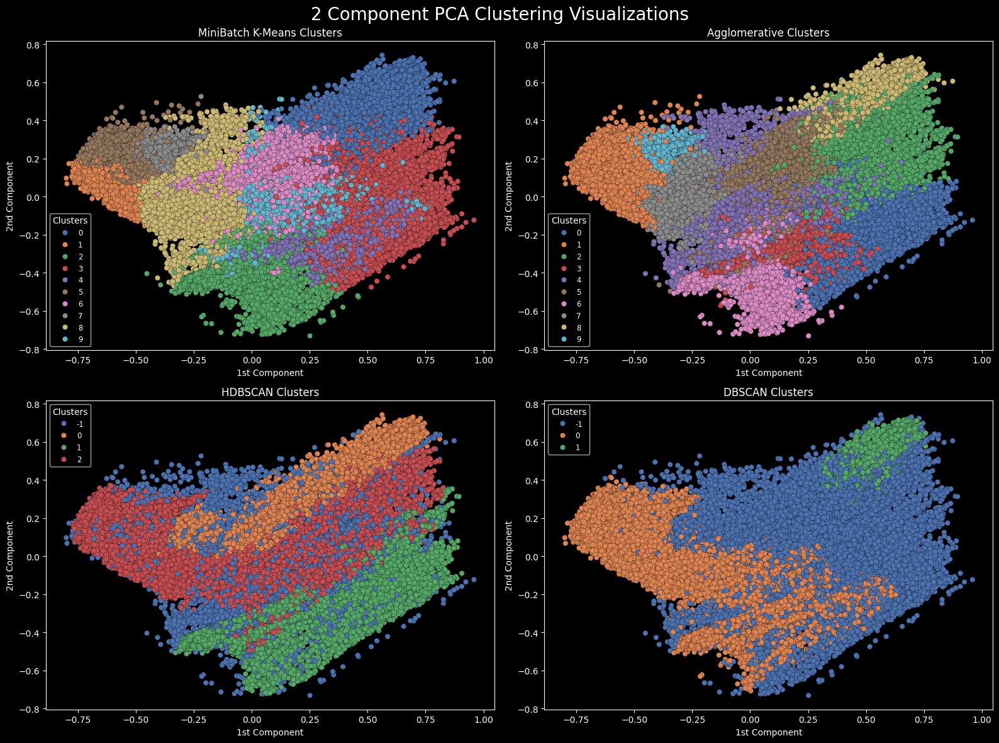

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# MBKMeans
sns.scatterplot(
    x="PCA1",
    y="PCA2",
    hue="Cluster_MBKMeans",
    data=pca_df,
    palette="deep",
    ax=axes[0, 0],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[0, 0].set_title("MiniBatch K-Means Clusters")

# Agglomerative
sns.scatterplot(
    x="PCA1",
    y="PCA2",
    hue="Agglo_Labels",
    data=pca_df,
    palette="deep",
    ax=axes[0, 1],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[0, 1].set_title("Agglomerative Clusters")

# HDBSCAN
sns.scatterplot(
    x="PCA1",
    y="PCA2",
    hue="HDBSCAN_cluster",
    data=pca_df,
    palette="deep",
    ax=axes[1, 0],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[1, 0].set_title("HDBSCAN Clusters")

# DBSCAN
sns.scatterplot(
    x="PCA1",
    y="PCA2",
    hue="DBSCAN_cluster",
    data=pca_df,
    palette="deep",
    ax=axes[1, 1],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[1, 1].set_title("DBSCAN Clusters")

for ax in axes.flatten():
    ax.legend(loc="best", fontsize="small", title="Clusters")
    ax.set_xlabel("1st Component", fontsize=10)
    ax.set_ylabel("2nd Component", fontsize=10)

fig.suptitle("2 Component PCA Clustering Visualizations", fontsize=20)
plt.tight_layout()
plt.show()

## T-SNE Visual Comparison

In [18]:
data_embedded = TSNE(
    n_components=2,
    learning_rate="auto",
    init="pca",
    random_state=random_state,
    n_jobs=-1,
    perplexity=40,
).fit_transform(scaled)

# Combine t-SNE results with cluster labels
tsne_df = pd.DataFrame(data=data_embedded, columns=["TSNE1", "TSNE2"])
tsne_df = pd.concat(
    [
        tsne_df,
        df_sampled[
            ["Cluster_MBKMeans", "DBSCAN_cluster", "HDBSCAN_cluster", "Agglo_Labels"]
        ].reset_index(drop=True),
    ],
    axis=1,
)

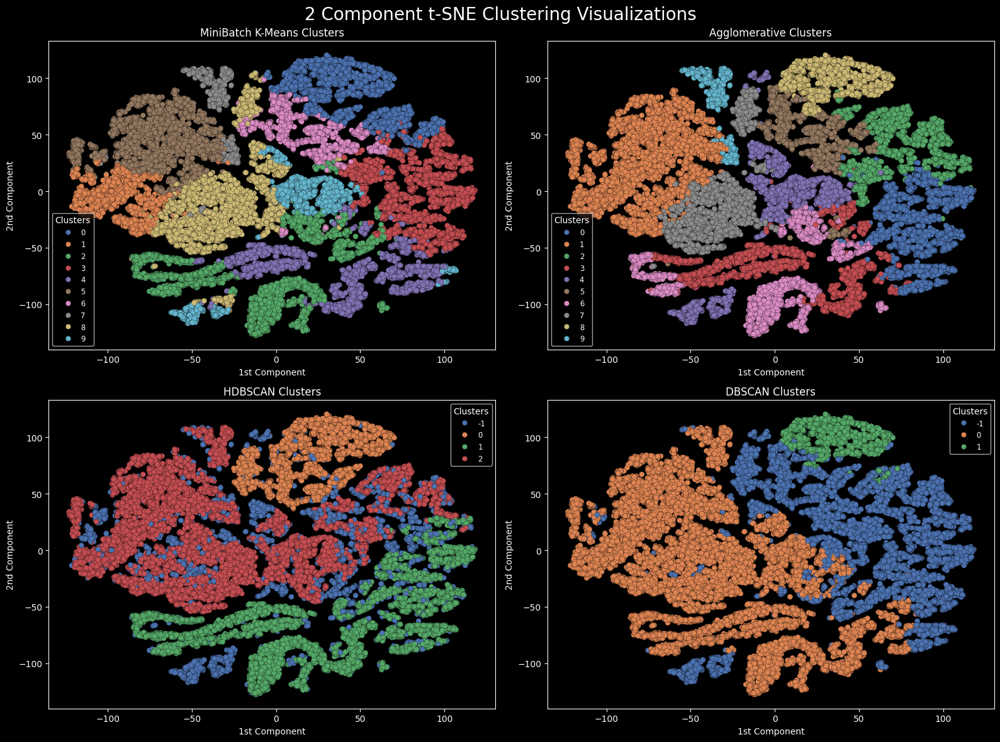

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# MBKMeans
sns.scatterplot(
    x="TSNE1",
    y="TSNE2",
    hue="Cluster_MBKMeans",
    data=tsne_df,
    palette="deep",
    ax=axes[0, 0],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[0, 0].set_title("MiniBatch K-Means Clusters")

# Agglomerative
sns.scatterplot(
    x="TSNE1",
    y="TSNE2",
    hue="Agglo_Labels",
    data=tsne_df,
    palette="deep",
    ax=axes[0, 1],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[0, 1].set_title("Agglomerative Clusters")

# HDBSCAN
sns.scatterplot(
    x="TSNE1",
    y="TSNE2",
    hue="HDBSCAN_cluster",
    data=tsne_df,
    palette="deep",
    ax=axes[1, 0],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[1, 0].set_title("HDBSCAN Clusters")

# DBSCAN
sns.scatterplot(
    x="TSNE1",
    y="TSNE2",
    hue="DBSCAN_cluster",
    data=tsne_df,
    palette="deep",
    ax=axes[1, 1],
    legend="brief",
    edgecolor='black',
    linewidth=0.2,
)
axes[1, 1].set_title("DBSCAN Clusters")

for ax in axes.flatten():
    ax.legend(loc="best", fontsize="small", title="Clusters")
    ax.set_xlabel("1st Component", fontsize=10)
    ax.set_ylabel("2nd Component", fontsize=10)
fig.suptitle("2 Component t-SNE Clustering Visualizations", fontsize=20)
plt.tight_layout()
plt.show()

## Cluster Feature Values

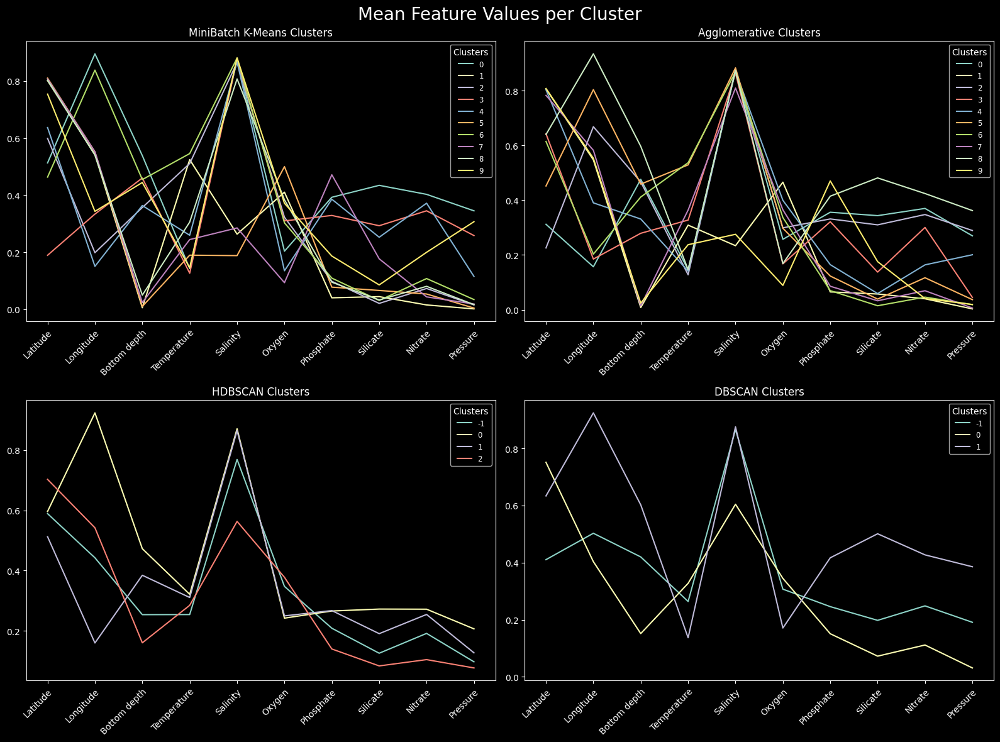

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# MBKMeans
for c in sorted(df_sampled.Cluster_MBKMeans.unique()):
    subset = df_sampled[df_sampled.Cluster_MBKMeans == c]
    sns.lineplot(
        data=subset.drop(
            columns=[
                "Cluster_MBKMeans",
                "DBSCAN_cluster",
                "HDBSCAN_cluster",
                "Agglo_Labels",
            ]
        ).mean(),
        label=c,
        ax=axes[0, 0],
    )
axes[0, 0].set_title("MiniBatch K-Means Clusters")

# Agglomerative
for c in sorted(df_sampled.Agglo_Labels.unique()):
    subset = df_sampled[df_sampled.Agglo_Labels == c]
    sns.lineplot(
        data=subset.drop(
            columns=[
                "Cluster_MBKMeans",
                "DBSCAN_cluster",
                "HDBSCAN_cluster",
                "Agglo_Labels",
            ]
        ).mean(),
        label=c,
        ax=axes[0, 1],
    )
axes[0, 1].set_title("Agglomerative Clusters")

# HDBSCAN
for c in sorted(df_sampled.HDBSCAN_cluster.unique()):
    subset = df_sampled[df_sampled.HDBSCAN_cluster == c]
    sns.lineplot(
        data=subset.drop(
            columns=[
                "Cluster_MBKMeans",
                "DBSCAN_cluster",
                "HDBSCAN_cluster",
                "Agglo_Labels",
            ]
        ).mean(),
        label=c,
        ax=axes[1, 0],
    )
axes[1, 0].set_title("HDBSCAN Clusters")

# DBSCAN
for c in sorted(df_sampled.DBSCAN_cluster.unique()):
    subset = df_sampled[df_sampled.DBSCAN_cluster == c]
    sns.lineplot(
        data=subset.drop(
            columns=[
                "Cluster_MBKMeans",
                "DBSCAN_cluster",
                "HDBSCAN_cluster",
                "Agglo_Labels",
            ]
        ).mean(),
        label=c,
        ax=axes[1, 1],
    )
axes[1, 1].set_title("DBSCAN Clusters")
for ax in axes.flatten():
    ax.set_xticklabels(
        ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor"
    )
    ax.legend(loc="best", fontsize="small", title="Clusters")
plt.suptitle("Mean Feature Values per Cluster", fontsize=20)
plt.tight_layout()
plt.show()

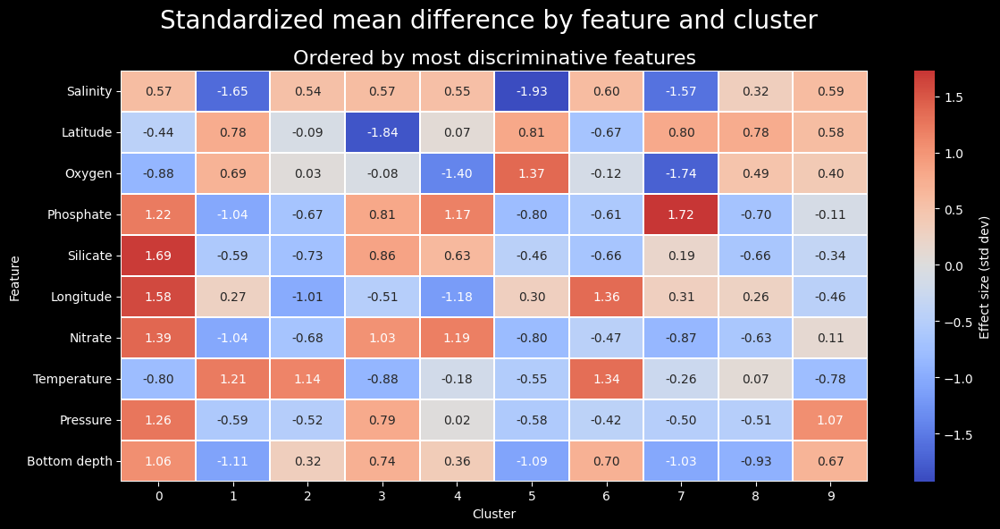

In [21]:
# Effect-size heatmap
data_for_effects = df_test.drop(columns=["Cluster_MBKMeans", "Depth", "Time", "Day", "Month", "Year"])
labels = df_test["Cluster_MBKMeans"]

# Total mean and std
global_mean = data_for_effects.mean()
global_std = data_for_effects.std(ddof=0).replace(0, 1e-12)  # avoid divide-by-zero

# Cluster means
cluster_means = data_for_effects.groupby(labels).mean().sort_index()

# Effect sizes: (cluster_mean - global_mean) / global_std
effects = (cluster_means - global_mean) / global_std

# Order features by max absolute effect across clusters
feature_order = effects.abs().max(axis=0).sort_values(ascending=False).index.tolist()
effects = effects[feature_order]

# Plot: features as rows, clusters as columns
plt.figure(
    figsize=(
        max(10, 1.2 * len(effects.index)),
        max(6, 0.35 * len(feature_order) + 2),
    )
)
sns.heatmap(
    effects.T,  # transpose: rows=features, cols=clusters
    cmap="coolwarm",
    annot=True,
    center=0,
    fmt=".2f",
    cbar_kws={"label": "Effect size (std dev)"},
    linewidths=0.2,
    linecolor="white",
)
plt.suptitle("Standardized mean difference by feature and cluster", fontsize=20, x=0.46)
plt.title("Ordered by most discriminative features", fontsize=16, x=0.5)
plt.xlabel("Cluster")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

## Cluster Spatial Exploration

In [22]:
# Geographical visualization of clusters by depth bins

# Create depth bins
df_test["Depth_bins"] = pd.cut(
    df_test["Depth"],
    bins=[-1, 200, 1000, 4000, 7000],
    labels=["Sunlight Depth", "Twilight Depth", "Midnight Depth", "Abyss and Deeper"],
)

# Sample 10% of data for visualization purposes
df_visual = df_test.sample(frac=0.1, replace=False, random_state=random_state).copy()

# Formatting cluster column as string for better color handling in plotly
df_visual["Cluster_MBKMeans"] = df_visual["Cluster_MBKMeans"].astype(str)

# Plot
fig = px.scatter_geo(
    df_visual,
    lat="Latitude",
    lon="Longitude",
    color="Cluster_MBKMeans",
    facet_col="Depth_bins",
    facet_col_wrap=1,
    facet_row_spacing=0.02,
    title="Geospatial Distribution of Clusters by Depth",
    opacity=0.8,
    width=1200,
    height=2300,
    labels={"Cluster_MBKMeans": "Cluster", "Depth_bins": "Depth"},
    category_orders={
        "Depth_bins": [
            "Sunlight Depth",
            "Twilight Depth",
            "Midnight Depth",
            "Abyss and Deeper",
        ],
        "Cluster_MBKMeans": sorted(df_visual["Cluster_MBKMeans"].unique(), key=int),
    },
)

fig.update_traces(marker=dict(size=5))
fig.update_layout(
    legend=dict(
        title="Cluster Legend",
        bordercolor="Black",
        bgcolor="white",
        borderwidth=1,
        itemsizing="constant",
        maxheight=1,
    ),
    paper_bgcolor="#fcfcfc",
    title=dict(font=dict(size=24)),
)

fig.update_geos(
    showland=True, landcolor="lightgrey", showocean=True, oceancolor="#d2eaf4"
)
fig.for_each_annotation(
    lambda a: a.update(
        text=a.text.split("=")[-1],
        font=dict(
            size=16,
        ),
    )
)
fig.show()

In [23]:
# 3D Scatter plot of clusters lat x long x depth
fig = px.scatter_3d(
    df_visual,
    x="Latitude",
    y="Longitude",
    z="Depth",
    color="Cluster_MBKMeans",
    title="Spatial Distribution of Clusters",
    labels={"Cluster_MBKMeans": "Cluster", "Depth": "Depth (meters)"},
    category_orders={
        "Cluster_MBKMeans": sorted(df_visual["Cluster_MBKMeans"].unique(), key=int)
    },
    width=1200,
    height=900,
)
fig.update_traces(marker=dict(size=2, opacity=0.8))
fig.update_layout(
    legend=dict(
        title="Cluster Legend",
        bordercolor="Black",
        bgcolor="white",
        borderwidth=1,
        itemsizing="constant",
    ),
    paper_bgcolor="#fcfcfc",
    title=dict(font=dict(size=24)),
)
fig.update_scenes(zaxis_autorange="reversed")
fig.show()

In [24]:
# Save cluster results
df_test.to_csv("data/ocean_MBKMeans_fulldata.csv", index=False)
df_sampled.to_csv("data/ocean_sample_allclusters.csv", index=False)
tsne_df.to_csv("data/ocean_tsne.csv", index=False)
pca_df.to_csv("data/ocean_pca.csv", index=False)